# Mobile Price Clustering

This project has been built as a part of a learning process of IBM's Unsupervised Learning course. The dataset choosen here is the `Mobile Price Classification` dataset. Several clsutering algorithms have been implemented like K-Means, Agglomerative, DBScan and Mean Shift and their results are thoroughly analyzed.



In [30]:
# Importing the required libraries for visualization 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os 
# os.chdir('data')

# Visualization Prefrences.
%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

In [19]:
%pip install xlrd==1.2.0

Note: you may need to restart the kernel to use updated packages.


## 01- Data Description Section

In [31]:
# Data Retrieving
# excel_file_path = "DryBeanDataset\Dry_Bean_Dataset.xlsx"

# df = pd.read_excel(excel_file_path,  sheet_name="sheet1", )
df=pd.read_csv("train.csv")
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.20,0,1,0,7,0.60,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.50,1,0,1,53,0.70,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.50,1,2,1,41,0.90,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.50,0,0,0,10,0.80,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.20,0,13,1,44,0.60,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [32]:
df.shape

(2000, 21)

In [33]:
# Extract Descriptive Data.
pd.set_option("display.float", "{:.2f}".format)
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,...,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00,2000.00
mean,1238.52,0.49,1.52,0.51,4.31,0.52,32.05,0.50,140.25,4.52,...,645.11,1251.52,2124.21,12.31,5.77,11.01,0.76,0.50,0.51,1.50
std,439.42,0.50,0.82,0.50,4.34,0.50,18.15,0.29,35.40,2.29,...,443.78,432.20,1084.73,4.21,4.36,5.46,0.43,0.50,0.50,1.12
min,501.00,0.00,0.50,0.00,0.00,0.00,2.00,0.10,80.00,1.00,...,0.00,500.00,256.00,5.00,0.00,2.00,0.00,0.00,0.00,0.00
25%,851.75,0.00,0.70,0.00,1.00,0.00,16.00,0.20,109.00,3.00,...,282.75,874.75,1207.50,9.00,2.00,6.00,1.00,0.00,0.00,0.75
50%,1226.00,0.00,1.50,1.00,3.00,1.00,32.00,0.50,141.00,4.00,...,564.00,1247.00,2146.50,12.00,5.00,11.00,1.00,1.00,1.00,1.50
75%,1615.25,1.00,2.20,1.00,7.00,1.00,48.00,0.80,170.00,7.00,...,947.25,1633.00,3064.50,16.00,9.00,16.00,1.00,1.00,1.00,2.25
max,1998.00,1.00,3.00,1.00,19.00,1.00,64.00,1.00,200.00,8.00,...,1960.00,1998.00,3998.00,19.00,18.00,20.00,1.00,1.00,1.00,3.00


## 02- Exploratory Data Analysis (EDA) & Feature Engineering Section 

In [34]:
# Check for Null Values
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [35]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

             count
price_range       
1              500
2              500
3              500
0              500


<Axes: title={'center': 'Price Counts'}, xlabel='price_range'>

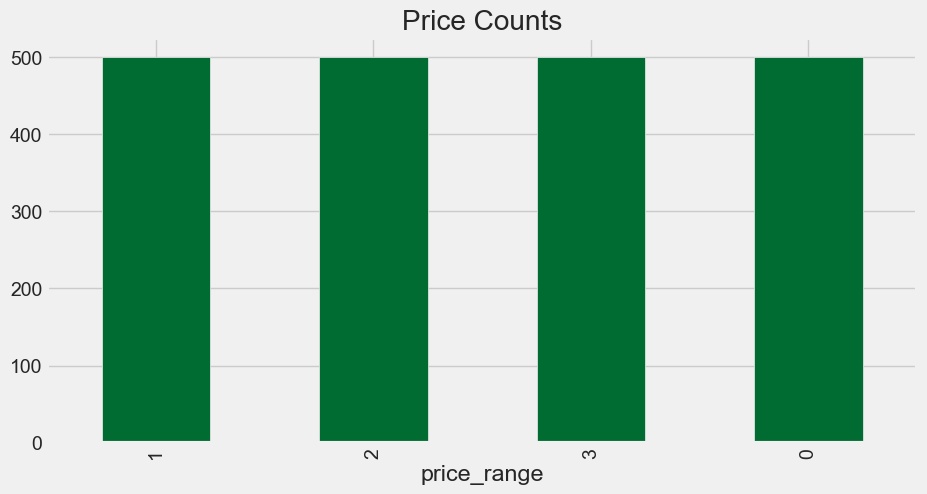

In [37]:
df_class_counts = df.price_range.value_counts().to_frame()
print(df_class_counts)
df.price_range.value_counts().plot(kind="bar", color='#006C31', figsize=(10,5), title = 'Price Counts')

In [39]:
# Check the percentage of each class 
df_class_perc = df.price_range.value_counts(normalize=True).to_frame()
print(df_class_perc)
df_class_perc["proportion"] = df_class_perc["proportion"] * 100 
df_class_perc.rename(columns = {"proportion": "proportion%"}, inplace=True)
df_class_perc

             proportion
price_range            
1                  0.25
2                  0.25
3                  0.25
0                  0.25


,proportion%
price_range,
1,25.00
2,25.00
3,25.00
0,25.00


(21.5, -0.5)

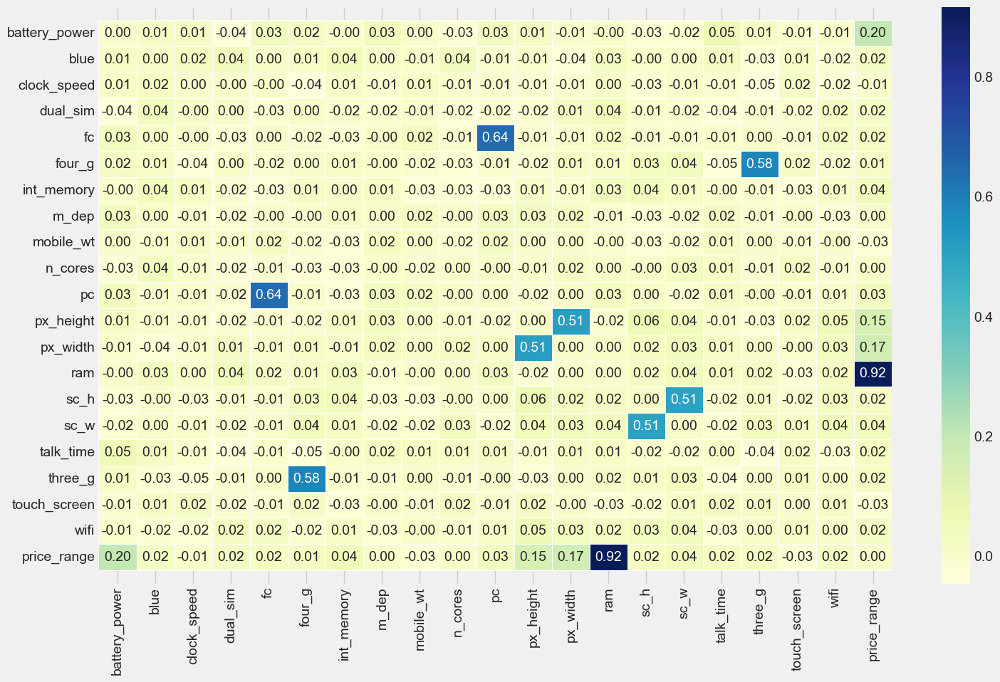

In [40]:
# Studying the correlations between features using Heat Map!
corr_matrix = df.corr()
for x in range(corr_matrix.shape[0]):
    corr_matrix.iloc[x,x] = 0.0

fig, ax = plt.subplots(figsize=(16, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [41]:
# The correlation matrix
corr_mat = df.corr()

# Strip out the diagonal values for the next step
for x in range(corr_mat.shape[0]):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
battery_power,0.00,0.01,0.01,-0.04,0.03,0.02,-0.00,0.03,0.00,-0.03,...,0.01,-0.01,-0.00,-0.03,-0.02,0.05,0.01,-0.01,-0.01,0.20
blue,0.01,0.00,0.02,0.04,0.00,0.01,0.04,0.00,-0.01,0.04,...,-0.01,-0.04,0.03,-0.00,0.00,0.01,-0.03,0.01,-0.02,0.02
clock_speed,0.01,0.02,0.00,-0.00,-0.00,-0.04,0.01,-0.01,0.01,-0.01,...,-0.01,-0.01,0.00,-0.03,-0.01,-0.01,-0.05,0.02,-0.02,-0.01
dual_sim,-0.04,0.04,-0.00,0.00,-0.03,0.00,-0.02,-0.02,-0.01,-0.02,...,-0.02,0.01,0.04,-0.01,-0.02,-0.04,-0.01,-0.02,0.02,0.02
fc,0.03,0.00,-0.00,-0.03,0.00,-0.02,-0.03,-0.00,0.02,-0.01,...,-0.01,-0.01,0.02,-0.01,-0.01,-0.01,0.00,-0.01,0.02,0.02
four_g,0.02,0.01,-0.04,0.00,-0.02,0.00,0.01,-0.00,-0.02,-0.03,...,-0.02,0.01,0.01,0.03,0.04,-0.05,0.58,0.02,-0.02,0.01
int_memory,-0.00,0.04,0.01,-0.02,-0.03,0.01,0.00,0.01,-0.03,-0.03,...,0.01,-0.01,0.03,0.04,0.01,-0.00,-0.01,-0.03,0.01,0.04
m_dep,0.03,0.00,-0.01,-0.02,-0.00,-0.00,0.01,0.00,0.02,-0.00,...,0.03,0.02,-0.01,-0.03,-0.02,0.02,-0.01,-0.00,-0.03,0.00
mobile_wt,0.00,-0.01,0.01,-0.01,0.02,-0.02,-0.03,0.02,0.00,-0.02,...,0.00,0.00,-0.00,-0.03,-0.02,0.01,0.00,-0.01,-0.00,-0.03
n_cores,-0.03,0.04,-0.01,-0.02,-0.01,-0.03,-0.03,-0.00,-0.02,0.00,...,-0.01,0.02,0.00,-0.00,0.03,0.01,-0.01,0.02,-0.01,0.00


In [42]:
# Pairwise maximal correlations 
corr_max  = corr_mat.abs().max().to_frame()
corr_id_max = corr_mat.abs().idxmax().to_frame()

# dataframe aggrigation and processing
pair_features_corr = pd.merge(corr_id_max, corr_max, on = corr_max.index)
pair_features_corr = pair_features_corr.rename(columns = {'key_0':'Feature_one', '0_x':'Feature_two', '0_y':'correlation'})\
                                                .sort_values('correlation', ascending=False)\
                                                .reset_index().drop('index', axis=1)
pair_features_corr


,Feature_one,Feature_two,correlation
0,price_range,ram,0.92
1,ram,price_range,0.92
2,fc,pc,0.64
3,pc,fc,0.64
4,three_g,four_g,0.58
5,four_g,three_g,0.58
6,px_width,px_height,0.51
7,px_height,px_width,0.51
8,sc_w,sc_h,0.51
9,sc_h,sc_w,0.51


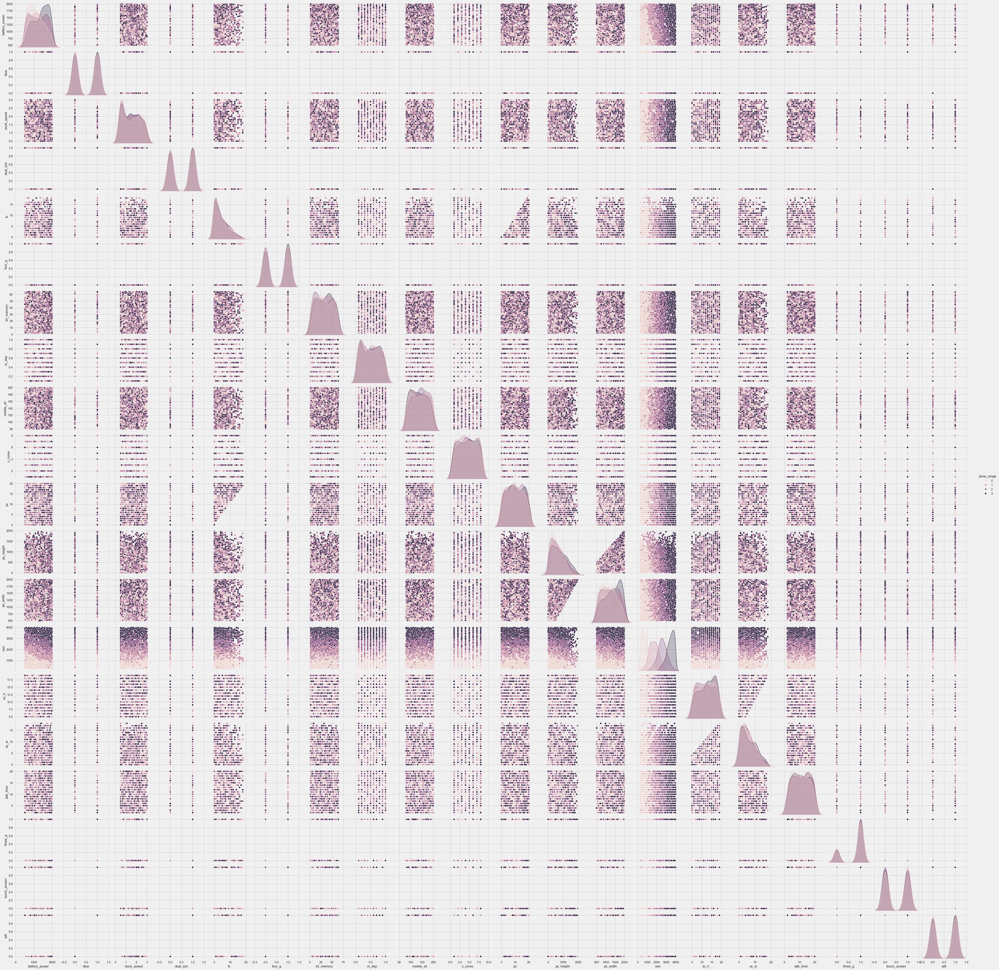

In [44]:
float_columns = [col for col in df.columns if col != 'price_range']

sns.set_context('notebook')
sns.pairplot(df[float_columns + ['price_range']], 
             hue='price_range'
             );
### END SOLUTION

And an examination of the skew values in anticipation of transformations.
- 0 : no skew
- pos : right skew
- neg : left skew

In [45]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns

,skewness_value
fc,1.02
px_height,0.67
sc_w,0.63
clock_speed,0.18
m_dep,0.09
int_memory,0.06
battery_power,0.03
blue,0.02
pc,0.02
px_width,0.01


In [46]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns = skew_columns.query('skewness_value > 0.75')
skew_columns

,skewness_value
fc,1.02


In [47]:
# Perform log transform on skewed columns
for col in skew_columns['skewness_value'].index.tolist():
    df[col] = np.log1p(df[col]) 

In [48]:
skew_trans_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_trans_columns

,skewness_value
px_height,0.67
sc_w,0.63
clock_speed,0.18
m_dep,0.09
int_memory,0.06
battery_power,0.03
blue,0.02
pc,0.02
px_width,0.01
talk_time,0.01


In [49]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc               float64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [50]:
df.head(7)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.20,0,0.69,0,7,0.60,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.50,1,0.00,1,53,0.70,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.50,1,1.10,1,41,0.90,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.50,0,0.00,0,10,0.80,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.20,0,2.64,1,44,0.60,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.50,1,1.39,0,22,0.70,164,1,...,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.70,0,1.61,1,10,0.80,139,8,...,381,1018,3220,13,8,18,1,0,1,3


In [51]:
from sklearn.preprocessing import StandardScaler
float_columns = [col for col in df.columns if col != 'price_range']
sc = StandardScaler()
df[float_columns] = sc.fit_transform(df[float_columns])
df.head(7)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,-0.90,-0.99,0.83,-1.02,-0.65,-1.04,-1.38,0.34,1.35,-1.10,...,-1.41,-1.15,0.39,-0.78,0.28,1.46,-1.79,-1.01,0.99,1
1,-0.50,1.01,-1.25,0.98,-1.41,0.96,1.16,0.69,-0.12,-0.66,...,0.59,1.70,0.47,1.11,-0.64,-0.73,0.56,0.99,-1.01,2
2,-1.54,1.01,-1.25,0.98,-0.21,0.96,0.49,1.38,0.13,0.21,...,1.39,1.07,0.44,-0.31,-0.86,-0.37,0.56,0.99,-1.01,2
3,-1.42,1.01,1.20,-1.02,-1.41,-1.04,-1.22,1.03,-0.26,0.65,...,1.29,1.24,0.59,0.88,0.51,-0.00,0.56,-1.01,-1.01,2
4,1.33,1.01,-0.40,-1.02,1.47,0.96,0.66,0.34,0.02,-1.10,...,1.27,-0.09,-0.66,-1.02,-0.86,0.73,0.56,0.99,-1.01,1
5,1.41,-0.99,-1.25,0.98,0.10,-1.04,-0.55,0.69,0.67,-1.54,...,0.81,0.93,-0.97,1.11,-1.09,-0.19,0.56,-1.01,-1.01,1
6,1.33,-0.99,0.22,-1.02,0.35,0.96,-1.22,1.03,-0.04,1.52,...,-0.60,-0.54,1.01,0.16,0.51,1.28,0.56,-1.01,0.99,3


## 03- Machine Learning Section : clusterning methods 


### 1- K-means Algorithm

In [52]:
### BEGIN SOLUTION
from sklearn.cluster import KMeans

# Create and fit a range of models
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df[float_columns])
    
    km_list.append(pd.Series({'clusters': clust, 
                              'inertia': km.inertia_,
                              'model': km}))




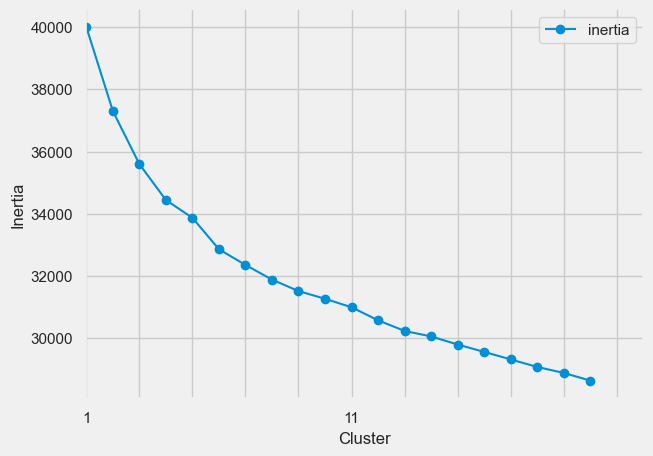

In [53]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

In [54]:
Bean_classes = pd.merge(df_class_counts, df_class_perc, on = df_class_counts.index)
Bean_classes.rename(columns={'key_0':'class_name'}, inplace=True)
Bean_classes

,class_name,count,proportion%
0,1,500,25.00
1,2,500,25.00
2,3,500,25.00
3,0,500,25.00


In [56]:
### BEGIN SOLUTION
km = KMeans(n_clusters=5, random_state=42)
km = km.fit(df[float_columns])
df['k-means'] = km.predict(df[float_columns])
df.sample(7)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range,k-means
363,-0.82,-0.99,-0.03,0.98,-1.41,0.96,-0.61,1.03,1.32,-0.23,...,-0.49,0.74,0.40,1.66,-0.00,0.56,-1.01,0.99,2,3
521,-0.25,1.01,-0.52,-1.02,1.10,0.96,0.77,1.38,-0.15,1.52,...,0.76,-0.64,-1.73,-1.32,-0.00,0.56,-1.01,-1.01,1,1
1484,1.03,1.01,-1.25,-1.02,1.30,-1.04,-1.27,-0.01,0.28,0.21,...,-1.33,0.47,-1.02,-0.41,-1.47,0.56,-1.01,-1.01,2,2
640,-1.45,-0.99,-1.25,-1.02,-1.41,-1.04,-0.99,1.03,-0.80,0.21,...,-1.17,-0.43,1.35,-1.32,-0.37,-1.79,-1.01,-1.01,0,0
1225,-1.18,-0.99,-1.25,0.98,0.71,0.96,-1.44,-0.35,1.52,-0.23,...,1.70,-1.47,-1.02,-0.41,-0.55,0.56,-1.01,0.99,0,4
1245,0.98,1.01,0.10,0.98,-1.41,-1.04,0.82,1.03,-0.04,1.52,...,1.47,-1.15,0.88,-1.32,-1.10,0.56,0.99,-1.01,1,4
644,1.08,-0.99,0.46,-1.02,0.35,0.96,-1.60,-1.39,0.87,0.21,...,0.93,-1.48,-1.26,-0.41,0.36,0.56,-1.01,-1.01,0,1


In [57]:
# Group by Class and K-means for comparsion between clustered classes and actual classes 
(df[['price_range','k-means']]
 .groupby(['price_range','k-means'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))
### END SOLUTION


number
price_range k-means        
0           0            62
            1           144
            2            90
            3           135
            4            69
1           0            71
            1           142
            2            71
            3           111
            4           105
2           0            62
            1           165
            2            74
            3           102
            4            97
3           0            68
            1           130
            2            68
            3            91
            4           143

### 2- Agglomerative Algorithm 

In [63]:
from sklearn.cluster import AgglomerativeClustering
### BEGIN SOLUTION
ag = AgglomerativeClustering(n_clusters=5, linkage='ward', compute_full_tree=True)
ag = ag.fit(df[float_columns])
df['agglom'] = ag.fit_predict(df[float_columns])

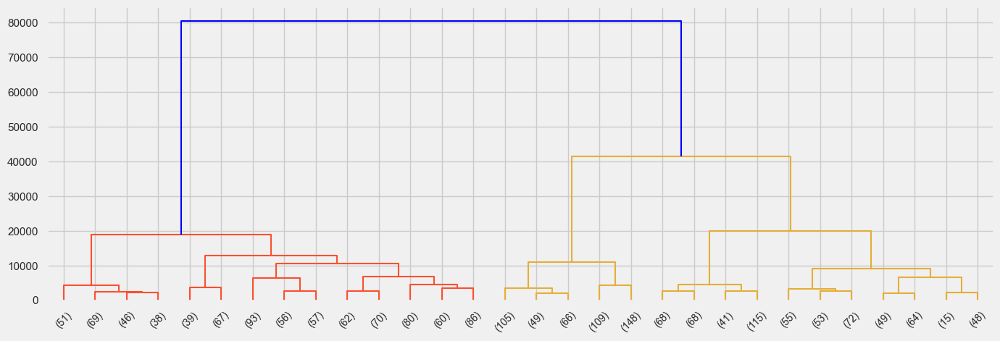

In [64]:
# First, we import the cluster hierarchy module from SciPy (described above) to obtain the linkage and dendrogram functions.
from scipy.cluster import hierarchy

Z = hierarchy.linkage(ag.children_, method='ward')

fig, ax = plt.subplots(figsize=(15,5))

den = hierarchy.dendrogram(Z, orientation='top', 
                           p=30, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax,
                           above_threshold_color='blue')
### END SOLUTION

In [65]:
# First, for Agglomerative Clustering:
(df[['price_range','agglom']]
 .groupby(['price_range','agglom'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
price_range agglom        
0           0          152
            1          140
            2           84
            3           71
            4           53
1           0          144
            1          141
            2          100
            3           78
            4           37
2           0          154
            1          128
            2           91
            3           82
            4           45
3           0          117
            1          133
            2          111
            3          107
            4           32

### 3- MeanShift Algorithm 


In [61]:
from sklearn.cluster import MeanShift
ms  = MeanShift(bandwidth=2.8, n_jobs=-1) 
ms = ms.fit(df[float_columns])

In [62]:
np.unique(ms.labels_)

array([   0,    1,    2, ..., 1769, 1770, 1771])

In [66]:
df['MeanShift'] = ms.fit_predict(df[float_columns])

In [67]:
(df[['price_range','MeanShift']]
 .groupby(['price_range','MeanShift'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
price_range MeanShift        
0           0               1
            2               1
            3               1
            4               3
            5               1
...                       ...
3           1728            1
            1739            1
            1745            1
            1753            1
            1767            1

[1870 rows x 1 columns]

### 4- DBSCAN Algorithm 


In [72]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps=0.5, min_samples=5, metric='euclidean')
dbs = dbs.fit(df[float_columns])

In [73]:
np.unique(dbs.labels_)

array([-1])

In [74]:
df['dbscan'] = dbs.fit_predict(df[float_columns])

In [75]:
# First, for Agglomerative Clustering:
(df[['price_range','dbscan']]
 .groupby(['price_range','dbscan'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,,number
price_range,dbscan,
0,-1,500
1,-1,500
2,-1,500
3,-1,500
